# <span style='color:red'>Part 1. Dara Preparation</span>

Here are the tips for dataset given by course:
1. Make sure your images are scaled correctly
2. Prepare a balanced dataset (have as many positive as negative examples)
3. Random shuffling of data
4. Splitting the data into a training and testing set
5. Normalization of features (typically to zero mean and unit variance)

## 1.1 Load dataset 

Load all car and not-car image files.

In [1]:
# import modules for this project
import cv2, time, sys, glob
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

%matplotlib inline

# Extract the file name list of car images from each folder
notcar_names_KITTI = glob.glob('./data/non-vehicles/Extras/*.png')
notcar_names_GTI = glob.glob('./data/non-vehicles/GTI/*.png')

# Extrat the file name list of not-car images from each folder
car_names_GTI_far = glob.glob('./data/vehicles/GTI_Far/*.png')
car_names_GTI_left = glob.glob('./data/vehicles/GTI_Left/*.png')
car_names_GTI_middle = glob.glob('./data/vehicles/GTI_MiddleClose/*.png')
car_names_GTI_right = glob.glob('./data/vehicles/GTI_Right/*.png')
car_names_GTI  = car_names_GTI_far + car_names_GTI_left + car_names_GTI_middle + car_names_GTI_right
car_names_KITTI = glob.glob('./data/vehicles/KITTI_extracted/*.png')

# Integrate the list of car and not-car images respectively
all_cars = car_names_GTI + car_names_KITTI
all_notcars = notcar_names_GTI + notcar_names_KITTI

def data_look(car_list, notcar_list):
    """
    Define a function to return some characteristics of the dataset
    """
    data_dict = {}
    # Define a key in data_dict 'n_cars' and store the number of car images
    data_dict['n_cars'] = len(car_list)
    # Define a key 'n_noncars' and store the number of noncar images
    data_dict['n_notcars'] = len(notcar_list)
    # Read in a test image, either car or noncar
    example_img = mpimg.imread(car_list[0])
    # Define a key 'image_shape' and store the test image 
    data_dict['image_shape'] = example_img.shape
    # Define a key 'data_type' and store the data type of the test images
    data_dict['data_type'] = example_img.dtype
    # Return the data dictionary
    return data_dict

# Explore the data balance
data_info = data_look(all_cars, all_notcars)

print('Your function returned a count of', 
      data_info["n_cars"], ' cars and', 
      data_info["n_notcars"], ' non-cars')
print('of size: ',data_info["image_shape"], ' and data type:', 
      data_info["data_type"])
print('Now we have a balanced dataset (have almost as many positive as negative examples)')

Your function returned a count of 8792  cars and 8968  non-cars
of size:  (64, 64, 3)  and data type: float32
Now we have a balanced dataset (have almost as many positive as negative examples)


## 1.2 Data Shuffle & Balance

Shuffle the entire car and not-car dataset and pick out the former 8500 items of each shuffled dataset to keep car as many as not-car.

In [2]:
from random import shuffle

# Shuffle
shuffle(all_cars)
shuffle(all_notcars)
# Balance 
cars = all_cars[:8500]
notcars = all_notcars[:8500]

## 1.3 Some Basic Fuctions

In [3]:
def cspace_convert(image, color_space):
    """
    The function converts rgb img into specified color space
    as a feature image.
    """
    # Apply color conversion if other than 'RGB'
    if color_space != 'RGB':
        if color_space == 'HSV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HSV)
        elif color_space == 'LUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2LUV)
        elif color_space == 'HLS':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2HLS)
        elif color_space == 'YUV':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YUV)
        elif color_space == 'YCrCb':
            feature_image = cv2.cvtColor(image, cv2.COLOR_RGB2YCrCb)
    # Otherwise return a copy of the input image
    else: 
        feature_image = np.copy(image)
        
    return feature_image


def update_progress(job_title, progress):
    """
    The function is an auxiliary tool to display a progress bar of other function.
    """
    length = 20 # modify this to change the length
    block = int(round(length*progress))
    msg = "\r{0}: [{1}] {2}%".format(job_title, "#"*block + "-"*(length-block), round(progress*100, 2))
    if progress >= 1: msg += " DONE\r\n"
    sys.stdout.write(msg)

# <span style='color:red'>Part 2. Choose Features</span>

In this part I'll decide what features to use. To begin with, I'll try and raw, color and gradient based features respectively, as well as the parameters tuning. Then I'm going to try combination of them
use the previous parameters tuning outcome. 

Steps:
- extract and explore raw features (color and shape)
- extract and explore color histogram features (color only)
- extract and explore HOG features (shape only)
- combine all color and shape features

## 2.1 Raw Pixel Features

### 2.1.1 Extract raw pixel features from a image

The pixel range of the feature image is [0.0, 1.0]


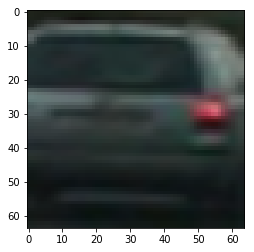

In [4]:
# import module 
import time
from sklearn.svm import LinearSVC
from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
# for scikit-learn <= 0.17 use:
# from sklearn.cross_validation import train_test_split

from skimage.feature import hog

# Reduce the sample size because HOG features are slow to compute
idn = np.random.randint(0, 8500)
image = mpimg.imread(cars[idn])
plt.imshow(image)
print('The pixel range of the feature image is [{}, {}]'.format(round(image.min()), round(image.max())))

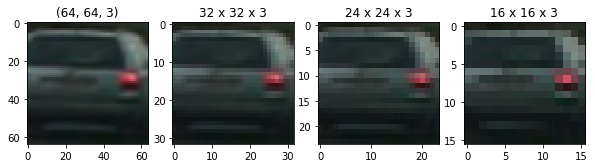

In [5]:
# Use cv2.resize() to resize the image
shape1 = image.shape
image_32 = cv2.resize(image, (32,32))
image_24 = cv2.resize(image, (24,24))
image_16 = cv2.resize(image, (16,16))

# Display resized images
fig = plt.figure(figsize=(10,4))
plt.subplot(141)
plt.imshow(image)
plt.title(image.shape)
plt.subplot(142)
plt.imshow(image_32, cmap='hot')
plt.title('32 x 32 x 3')
plt.subplot(143)
plt.imshow(image_24, cmap='hot')
plt.title('24 x 24 x 3')
plt.subplot(144)
plt.imshow(image_16, cmap='hot')
plt.title('16 x 16 x 3')
fig.savefig('./output_images/resize.png')

In [6]:
def bin_spatial(img, spatial_size=(24,24)):
    """
    The function computes binned color histogram features
    in both y and x directions.
    
    """
    # Use cv2.resize().ravel() to create the feature vector
    resize_img = cv2.resize(img, spatial_size)
    features = resize_img.ravel()
    # Return the feature vector
    return features

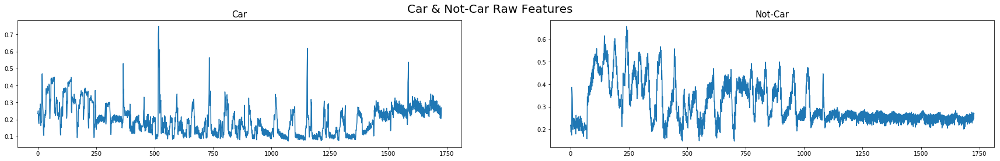

In [7]:
# Randomly select a car image as well as a notcar as examples to try function above
ind1 = np.random.randint(0, 8500)
ind2 = np.random.randint(0, 8500)
car_imgex = mpimg.imread(cars[ind1])
notcar_imgex = mpimg.imread(notcars[ind2])

fig = plt.figure(figsize=(30,4))
plt.subplot(121)
plt.plot(bin_spatial(car_imgex, spatial_size=(24,24)))
plt.title('Car', fontsize=15)
plt.subplot(122)
plt.plot(bin_spatial(notcar_imgex, spatial_size=(24,24)))
plt.title('Not-Car', fontsize=15)
fig.subplots_adjust(hspace=0.2)
fig.suptitle('Car & Not-Car Raw Features', fontsize=20)
fig.savefig('./output_images/raw_features.png')

### 2.1.2 Extract raw features from images both of car and notcar

In [8]:
def extract_raw_features(imgs_list, color_space='RGB', 
                         spatial_size=(24,24), progress_bar=True):
    """
    The function extracts features from a list of images.
    It calls `bin_spatial()`
    """
    # Create a list to append feature vectors to
    features = []
    
    # Iterate through the list of images
    for file in imgs_list:
        # Read in each one by one
        image = mpimg.imread(file)
        # Converts image into specified color space as feature image
        feature_img = cspace_convert(image, color_space)
        # Apply bin_spatial() to get spatial color features
        spatial_features = bin_spatial(feature_img, spatial_size)
        # Append the new feature vector to the features list
        features.append(spatial_features)
        
        # Show progress bar
        if progress_bar == True:
            # Get the index of the current file
            ind = imgs_list.index(file)
            # Calculate and show the progress rate
            update_progress('Extract raw features', (ind+1)/len(imgs_list))     
    
    # Return the list of feature vectors
    return features

### 2.1.3 Parameter tuning for raw features extraction

In [9]:
# Set parameters
p_ss = (24,24) # spatial space
p_cs_raw = 'RGB' # color space for raw features

# Extract raw features
t_start=time.time()
print('From 1000 CAR images...')
car_raw_features = extract_raw_features(cars[:1000], color_space=p_cs_raw, spatial_size=p_ss, progress_bar=True)
print('From 1000 NONCAR images...')
notcar_raw_features = extract_raw_features(notcars[:1000], color_space=p_cs_raw, spatial_size=p_ss, progress_bar=True)
t_end=time.time()
print(round(t_end-t_start, 2), 'Seconds to finish extracting raw features.')
print('The raw feature shape of each image is ', car_raw_features[0].shape)

# Create an array stack of raw feature vectors
X_raw = np.vstack((car_raw_features, notcar_raw_features)).astype(np.float64)

# Define the labels vector
y_raw = np.hstack((np.ones(len(car_raw_features)), np.zeros(len(notcar_raw_features))))

# Split up data into randomized training and test sets
rand_state_raw = np.random.randint(0, 100)
X_raw_train, X_raw_test, y_raw_train, y_raw_test = train_test_split(
    X_raw, y_raw, test_size=0.2, random_state=rand_state_raw)

# Fit a per-column scaler only on the training data
X_raw_scaler = StandardScaler().fit(X_raw_train)
# Apply the scaler to X_color_tain and X_color_test
X_raw_train = X_raw_scaler.transform(X_raw_train)
X_raw_test = X_raw_scaler.transform(X_raw_test)

print('Using spatial size of :', p_ss, 'and', p_cs_raw, 'color space')
print('Raw feature vector length:', len(X_raw_train[0]))
# Use a linear SVC
raw_svc = LinearSVC()
# Check the training time for the SVC
t_start=time.time()
raw_svc.fit(X_raw_train, y_raw_train)
t_end=time.time()
print(round(t_end-t_start, 2), 'Second to train raw features SVC. ')
# Check the score of the SVC
print('Test Accuracy of raw SVC is ', round(raw_svc.score(X_raw_test, y_raw_test), 4))
# Check the prediction time for a single sample
t_start=time.time()
n_predict_raw = 20

print('My SVC predicts are: ', raw_svc.predict(X_raw_test[:n_predict_raw]))  
print('For these', n_predict_raw, 'labels: ', y_raw_test[:n_predict_raw])
t_end=time.time()      
print(round(t_end-t_start, 5), 'Seconds to predict', n_predict_raw, 'labels with raw SVC')

From 1000 CAR images...
Extract raw features: [####################] 100.0% DONE
From 1000 NONCAR images...
Extract raw features: [####################] 100.0% DONE
3.12 Seconds to finish extracting raw features.
The raw feature shape of each image is  (1728,)
Using spatial size of : (24, 24) and RGB color space
Raw feature vector length: 1728
2.26 Second to train raw features SVC. 
Test Accuracy of raw SVC is  0.895
My SVC predicts are:  [1. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0.]
For these 20 labels:  [0. 1. 0. 0. 1. 0. 1. 0. 0. 0. 0. 0. 1. 0. 1. 1. 0. 0. 0. 0.]
0.00195 Seconds to predict 20 labels with raw SVC


## 2.2 Color Histogram Features

### 2.2.1 Extract color histogram features from a single image

In [10]:
def color_hist(img, hist_bins=32, bins_range=(0, 256)):
    """
    The function computes color histogram features
    """
    # Ensure image pixel range is (0, 255) 
    if img.max()<= 1:
        img = img*255
    
    # Compute the histogram of the 3 color channels separately
    channel1_hist = np.histogram(img[:,:,0], bins=hist_bins, range=bins_range)
    channel2_hist = np.histogram(img[:,:,1], bins=hist_bins, range=bins_range)
    channel3_hist = np.histogram(img[:,:,2], bins=hist_bins, range=bins_range)
    # Concatenate the histograms into a single feature vector
    hist_features = np.concatenate((channel1_hist[0], channel2_hist[0], channel3_hist[0]))
    # Return the individual histograms, bin_centers and feature vector
    return hist_features

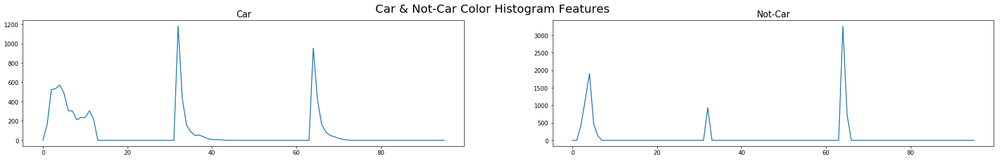

In [11]:
# Randomly select a car image as well as a notcar as examples to try function above
ind1 = np.random.randint(0, 8500)
ind2 = np.random.randint(0, 8500)
car_imgex = cspace_convert(mpimg.imread(cars[ind1]), 'LUV')
notcar_imgex = cspace_convert(mpimg.imread(notcars[ind2]), 'LUV')

fig = plt.figure(figsize=(30,4))
plt.subplot(121)
plt.plot(color_hist(car_imgex, hist_bins=32, bins_range=(0, 256)))
plt.title('Car', fontsize=15)
plt.subplot(122)
plt.plot(color_hist(notcar_imgex, hist_bins=32, bins_range=(0, 256)))
plt.title('Not-Car', fontsize=15)
fig.subplots_adjust(hspace=0.2)
fig.suptitle('Car & Not-Car Color Histogram Features', fontsize=20)
fig.savefig('./output_images/color_histogram.png')

### 2.2.2 Extract color histogram features from images both of car and notcar

In [12]:
def extract_color_features(imgs_list, color_space='LUV', 
                        hist_bins=32, bins_range=(0, 256), progress_bar=True):
    """
    The function extracts features from a list of images.
    It calls `bin_spatial()` and `color_hist()`
    """
    # Create a list to append feature vectors to
    features = []
    
    # Iterate through the list of images
    for file in imgs_list:
        # Read in each one by one
        image = mpimg.imread(file) # read .png on a scale of (0, 1)
        # Converts img into specified color space as feature image
        feature_image = cspace_convert(image, color_space)
        
        # Apply color_hist() with a color space option 
        hist_features = color_hist(feature_image, hist_bins=hist_bins, bins_range=bins_range)
        # Append the new feature vector to the features list
        features.append(hist_features)
        
        # Show a progress bar
        if progress_bar == True:
            # Get the index of the current file
            ind = imgs_list.index(file) 
            # Calculate and show the rate of progress 
            update_progress('Extract color histogram features',(ind+1)/len(imgs_list))
    
    # Return the list of feature vectors and correspondding shape
    return features

### 2.2.3 Parameter tuning for color histogram features extraction

In [13]:
# Set parameters 
p_hb = 32  # hist_bins
p_br = (0, 256)  # bins_range
p_cs_color = 'LUV'  # color space for color histogram: 'RGB', 'HSV', 'LUV', 'HLS', 'YUV', 'YCrCb'
p_pb = True  # whether to show a progress bar

# Extract color histogram features
t_start=time.time()
print('From 1000 CAR images...')
car_color_features = extract_color_features(cars[:1000], color_space=p_cs_color, hist_bins=p_hb, bins_range=p_br, progress_bar=True)
print('From 1000 NONCAR images...')
notcar_color_features = extract_color_features(notcars[:1000], color_space=p_cs_color, hist_bins=p_hb, bins_range=p_br, progress_bar=True)
t_end=time.time()
print(round(t_end-t_start, 2), 'Seconds to finish extracting color features.')
print('The color feature shape of each image is ', car_color_features[0].shape)

# Create an array stack of color feature vectors
X_color = np.vstack((car_color_features, notcar_color_features)).astype(np.float64)

# Define the labels vector
y_color = np.hstack((np.ones(len(car_color_features)), np.zeros(len(notcar_color_features))))

# Split up data into randomized training and test sets
rand_state_color = np.random.randint(0, 100)
X_color_train, X_color_test, y_color_train, y_color_test = train_test_split(
    X_color, y_color, test_size=0.2, random_state=rand_state_color)

# Fit a per-column scaler only on the training data
X_color_scaler = StandardScaler().fit(X_color_train)
# Apply the scaler to X_color_tain and X_color_test
X_color_train = X_color_scaler.transform(X_color_train)
X_color_test = X_color_scaler.transform(X_color_test)

print('Color space for color histogram features:', p_cs_color)
print('Using spatial binning of ', p_br, 'and', p_hb, 'histogram bins')
print('Color histogram feature vector length:', len(X_color_train[0]))
# Use a linear SVC
color_svc = LinearSVC()
# Check the training time for the SVC
t_start=time.time()
color_svc.fit(X_color_train, y_color_train)
t_end=time.time()
print(round(t_end-t_start, 2), 'Second to train color histogram SVC... ')
# Check the score of the SVC
print('Test Accuracy of color histogram SVC is', round(color_svc.score(X_color_test, y_color_test), 4))
# Check the prediction time for a single sample
t_start=time.time()
n_predict_color = 20
print('My SVC predicts are: ', color_svc.predict(X_color_test[:n_predict_color]))  
print('For these', n_predict_color, 'labels: ', y_color_test[:n_predict_color])
t_end=time.time()      
print(round(t_end-t_start, 5), 'Seconds to predict', n_predict_color, 'labels with color histogram SVC')

From 1000 CAR images...
Extract color histogram features: [####################] 100.0% DONE
From 1000 NONCAR images...
Extract color histogram features: [####################] 100.0% DONE
3.48 Seconds to finish extracting color features.
The color feature shape of each image is  (96,)
Color space for color histogram features: LUV
Using spatial binning of  (0, 256) and 32 histogram bins
Color histogram feature vector length: 96
0.14 Second to train color histogram SVC... 
Test Accuracy of color histogram SVC is 0.9125
My SVC predicts are:  [1. 0. 1. 0. 0. 1. 0. 1. 1. 0. 0. 1. 0. 0. 0. 1. 1. 1. 1. 0.]
For these 20 labels:  [1. 0. 1. 1. 0. 1. 0. 1. 1. 0. 0. 1. 0. 0. 0. 1. 1. 1. 1. 0.]
0.0016 Seconds to predict 20 labels with color histogram SVC


## 2.3 HOG Features

In the exercise below, you're given all the code to extract HOG features and train a linear SVM. There is no right or wrong answer, but your mission, should you choose to accept it, is to play with the parameters `colorspace`, `orient`, `pix_per_cell`, `cell_per_block`, and `hog_channel` to get a feel for what combination of parameters give the best results.

[`skimage.feature.hog()`](http://scikit-image.org/docs/dev/api/skimage.feature.html?highlight=feature%20hog#skimage.feature.hog)

### 2.3.1 Extract HOG features from a image

In [14]:
from skimage.feature import hog

def get_hog_features(channel_img, orient=9, pix_per_cell=8, cell_per_block=2, vis=False, feature_vec=True):
    """
    The function accepts params and returns HOG features (optional flattened) 
    and an optional matrix for visualization. 
    Features will always be the first return (flattened is feature_vector=True).
    A visualization matrix will be the second return if vis=True.
    """
    # Call with two outputs if vis==True
    if vis==True:
        features, hog_image = hog(channel_img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                                  cells_per_block=(cell_per_block, cell_per_block),block_norm='L2-Hys',
                                  transform_sqrt=False,
                                  visualise=vis, feature_vector=feature_vec)
        return features, hog_image
    # Otherwise call with one output
    else:
        features = hog(channel_img, orientations=orient, pixels_per_cell=(pix_per_cell, pix_per_cell),
                       cells_per_block=(cell_per_block, cell_per_block), block_norm='L2-Hys',
                       transform_sqrt=False, 
                       visualise=vis, feature_vector=feature_vec)
        return features

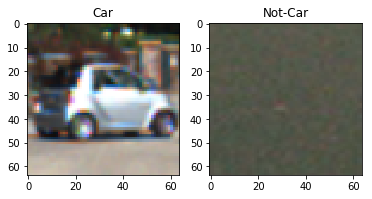

In [15]:
    
# Randomly select a car image as well as a notcar as examples
ind1 = np.random.randint(0, 8500)
ind2 = np.random.randint(0, 8500)
car_imgex = mpimg.imread(cars[ind1])
notcar_imgex = mpimg.imread(notcars[ind2])

fig = plt.figure()
plt.subplot(121)
plt.imshow(car_imgex)
plt.title('Car')
plt.subplot(122)
plt.imshow(notcar_imgex)
plt.title('Not-Car')
fig.savefig('./output_images/car&notcar.png')

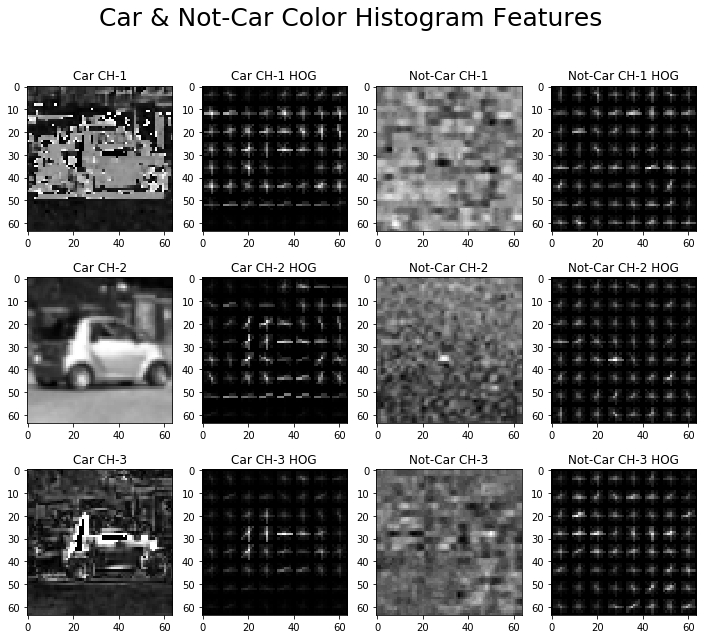

In [16]:
# color space: 'RGB', 'HSV', 'LUV', 'HLS', 'YUV', 'YCrCb'
car_img = cspace_convert(car_imgex, 'HLS')
notcar_img = cspace_convert(notcar_imgex, 'HLS')

_, car_hog1 = get_hog_features(car_img[:,:,0], orient=12, pix_per_cell=8, 
                               cell_per_block=2, vis=True, feature_vec=True)
_, car_hog2 = get_hog_features(car_img[:,:,1], orient=12, pix_per_cell=8, 
                               cell_per_block=2, vis=True, feature_vec=True)
_, car_hog3 = get_hog_features(car_img[:,:,2], orient=12, pix_per_cell=8, 
                               cell_per_block=2, vis=True, feature_vec=True)
_, notcar_hog1 = get_hog_features(notcar_img[:,:,0], orient=12, pix_per_cell=8, 
                                  cell_per_block=2, vis=True, feature_vec=True)
_, notcar_hog2 = get_hog_features(notcar_img[:,:,1], orient=12, pix_per_cell=8, 
                                  cell_per_block=2, vis=True, feature_vec=True)
_, notcar_hog3 = get_hog_features(notcar_img[:,:,2], orient=12, pix_per_cell=8, 
                                  cell_per_block=2, vis=True, feature_vec=True)


fig, arr = plt.subplots(3, 4, figsize=(12,10))

arr[0,0].imshow(car_img[:,:,0], cmap='gray')
arr[0,0].set_title('Car CH-1')
arr[1,0].imshow(car_img[:,:,1], cmap='gray')
arr[1,0].set_title('Car CH-2')
arr[2,0].imshow(car_img[:,:,2], cmap='gray')
arr[2,0].set_title('Car CH-3')

arr[0,1].imshow(car_hog1, cmap='gray')
arr[0,1].set_title('Car CH-1 HOG')
arr[1,1].imshow(car_hog2, cmap='gray')
arr[1,1].set_title('Car CH-2 HOG')
arr[2,1].imshow(car_hog3, cmap='gray')
arr[2,1].set_title('Car CH-3 HOG')

arr[0,2].imshow(notcar_img[:,:,0], cmap='gray')
arr[0,2].set_title('Not-Car CH-1')
arr[1,2].imshow(notcar_img[:,:,1], cmap='gray')
arr[1,2].set_title('Not-Car CH-2')
arr[2,2].imshow(notcar_img[:,:,2], cmap='gray')
arr[2,2].set_title('Not-Car CH-3')

arr[0,3].imshow(notcar_hog1, cmap='gray')
arr[0,3].set_title('Not-Car CH-1 HOG')
arr[1,3].imshow(notcar_hog2, cmap='gray')
arr[1,3].set_title('Not-Car CH-2 HOG')
arr[2,3].imshow(notcar_hog3, cmap='gray')
arr[2,3].set_title('Not-Car CH-3 HOG')

fig.subplots_adjust(hspace=0.2)
fig.suptitle('Car & Not-Car Color Histogram Features', fontsize=25)
fig.savefig('./output_images/hog_visualize.png')

### 2.3.2 Extract HOG features from images both of car and notcar

In [17]:
def extract_hog_features(imgs_list, color_space='HLS', orient=12, 
                         pix_per_cell=8, cell_per_block=2, hog_channel=1,
                         progress_bar=True):
    """
    Define a function to extract hog features from a list of images
    It calls `get_hog_features()`
    """
    # Create a list to append feature vectors to 
    features = []
    # Iterate through the list of images
    for file in imgs_list:
        # Read in each one by one
        image = mpimg.imread(file)
        
        # Apply color conversion if other than 'RGB'
        feature_image = cspace_convert(image, color_space=color_space)  
        
        # Call get_hog_features() with vis=False, feature_vec=True
        if hog_channel=='All':
            hog_features = []
            for channel in range(feature_image.shape[2]):
                channel_hog_feature = get_hog_features(feature_image[:,:,channel],
                                                       orient, pix_per_cell, cell_per_block,
                                                       vis=False, feature_vec=True )
                hog_features.append(channel_hog_feature)
            hog_features = np.ravel(hog_features)
        else:
            hog_features = get_hog_features(feature_image[:,:,hog_channel],
                                            orient, pix_per_cell, cell_per_block, 
                                            vis=False, feature_vec=True)
        # Append the hog features
        features.append(hog_features)
        
        # Show progress bar
        if progress_bar == True:
            # Get the index of the current file
            ind = imgs_list.index(file) 
            # Calculate and show the rate of progress 
            update_progress('Extract HOG features',(ind+1)/len(imgs_list))
 
    # Return list of feature vectors and its shape
    return features

### 2.3.3 Parameter tuning for HOG features extraction

In [18]:
# Set parameters 
p_cs_hog = 'HLS' # color space for hog: 'RGB', 'HSV', 'LUV', 'HLS', 'YUV', 'YCrCb'
p_o = 12 # orient for hog
p_ppc = 8 # pix_per_cell
p_cpb = 2 # cell_per_block
p_hc = 1 # hog_channel: 0, 1, 2 or 'All'

# Extract HOG features
t_start=time.time()
print('From 1000 CAR images...')
car_hog_features = extract_hog_features(cars[:1000], color_space=p_cs_hog, orient=p_o,
                                        pix_per_cell=p_ppc, cell_per_block=p_cpb,
                                        hog_channel=p_hc, progress_bar=p_pb)
print('From 1000 NONCAR images...')
notcar_hog_features = extract_hog_features(notcars[:1000], color_space=p_cs_hog, orient=p_o, 
                                           pix_per_cell=p_ppc, cell_per_block=p_cpb,
                                           hog_channel=p_hc, progress_bar=p_pb)
t_end=time.time()
print(round(t_end-t_start, 2), 'Seconds to finish extracting HOG features.')
print('The hog feature shape of each image is ', car_hog_features[0].shape)

# Create an array stack of HOG feature vectors
X_hog  = np.vstack((car_hog_features, notcar_hog_features)).astype(np.float64)

# Define the labels vector
y_hog = np.hstack((np.ones(len(car_hog_features)), np.zeros(len(notcar_hog_features))))

# Split up data into randomized training and test sets
rand_state_hog = np.random.randint(0, 100)
X_hog_train, X_hog_test, y_hog_train, y_hog_test = train_test_split(
    X_hog, y_hog, test_size=0.2, random_state=rand_state_hog)

# Fit a per-column scaler
X_hog_scaler = StandardScaler().fit(X_hog_train)
# Apply the scaler to X_hog
X_hog_train = X_hog_scaler.transform(X_hog_train)
X_hog_test = X_hog_scaler.transform(X_hog_test)

print('Color space for HOG features:', p_cs_hog)
print('Using:', p_o, 'orientations', p_ppc,
     'pixels per cell and', p_cpb, 'cells per block')
print('HOG feature vector length:', len(X_hog_train[0]))
# Use a linear SVC
hog_svc = LinearSVC()
# Check the training time for the SVC
t_start=time.time()
hog_svc.fit(X_hog_train, y_hog_train)
t_end=time.time()
print(round(t_end-t_start, 2), 'Second to train HOG SVC... ')
# Check the score of the SVC
print('Test Accuracy of HOG SVC is ', round(hog_svc.score(X_hog_test, y_hog_test), 4))
# Check the prediction time for a single sample
t_start=time.time()
n_predict_hog = 10
print('My SVC predicts are: ', hog_svc.predict(X_hog_test[0:n_predict_hog]))
print('For these', n_predict_hog, 'labels: ', y_hog_test[0:n_predict_hog])
t_end=time.time()
print(round(t_end-t_start, 5), 'Second to predict', n_predict_hog, 'labels with HOG SVC')

From 1000 CAR images...
Extract HOG features: [####################] 100.0% DONE
From 1000 NONCAR images...
Extract HOG features: [####################] 100.0% DONE
8.06 Seconds to finish extracting HOG features.
The hog feature shape of each image is  (2352,)
Color space for HOG features: HLS
Using: 12 orientations 8 pixels per cell and 2 cells per block
HOG feature vector length: 2352
3.5 Second to train HOG SVC... 
Test Accuracy of HOG SVC is  0.875
My SVC predicts are:  [1. 0. 0. 0. 1. 1. 1. 1. 1. 1.]
For these 10 labels:  [1. 0. 0. 0. 1. 1. 1. 1. 1. 1.]
0.00125 Second to predict 10 labels with HOG SVC


## 2.4 Synthetical Features

In [19]:
def extract_features(imgs_list, color_space=['RGB', 'LUV', 'HLS'], 
                     spatial_size=(24,24) ,hist_bins=32, bins_range=(0, 256),
                     orient=12, pix_per_cell=8, cell_per_block=2, hog_channel=1,
                     progress_bar=False):
    """
    The function extracts both color and HOG features from a list of images.
    It calls `extract_raw_features()`, `extract_color_features()` and `extract_hog_features()` 
    """
    # Extract raw, color histogram and hog feature vectors repectively 
    raw_features = extract_raw_features(imgs_list, color_space[0], spatial_size, progress_bar)
    color_features = extract_color_features(imgs_list, color_space[1], hist_bins, bins_range, progress_bar)
    hog_features = extract_hog_features(imgs_list, color_space[2], orient, pix_per_cell, 
                                        cell_per_block, hog_channel, progress_bar)
    # Concatenate these two feature vectors and corresponding shapes
    features = [np.hstack((raw, color, hog)) for raw,color,hog in zip(raw_features, color_features, hog_features)]
    
    # Return the list of synthetical feature vectors
    return features

In [20]:
# Extract synthetical features
t_start=time.time()
print('From 1000 CAR images...')
car_syn_features = extract_features(cars[:1000],progress_bar=True)
print('From 1000 NONCAR images...')
notcar_syn_features = extract_features(notcars[:1000],progress_bar=True)
t_end=time.time()
print(round(t_end-t_start, 2), 'Seconds to finish extracting synthetical features. ')
print('The synthetical feature shape of each feature image is ', car_syn_features[0].shape, '=',
     car_raw_features[0].shape,'+',car_color_features[0].shape,'+',car_hog_features[0].shape)

# Create an array stack of synthetical feature vectors
X_syn  = np.vstack((car_syn_features, notcar_syn_features)).astype(np.float64)

# Define the labels vector
y_syn = np.hstack((np.ones(len(car_syn_features)), np.zeros(len(notcar_syn_features))))

# Split up data into randomized training and test sets
rand_state_syn = np.random.randint(0, 100)
X_syn_train, X_syn_test, y_syn_train, y_syn_test = train_test_split(X_syn, y_syn, test_size=0.2, random_state=rand_state_syn)

# Fit a per-column scaler
X_syn_scaler = StandardScaler().fit(X_syn_train)
# Apply the scaler to X
X_syn_train = X_syn_scaler.transform(X_syn_train)
X_syn_test = X_syn_scaler.transform(X_syn_test)

print('Using:', p_o, 'orientations', p_ppc,
     'pixels per cell and', p_cpb, 'cells per block')
print('Synthetical feature vector length:', len(X_syn_train[0]))
# Use a linear SVC
syn_svc = LinearSVC()
# Check the training time for the SVC
t_start=time.time()
syn_svc.fit(X_syn_train, y_syn_train)
t_end=time.time()
print(round(t_end-t_start, 2), 'Second to train synthetical SVC... ')
# Check the score of the SVC
print('Test Accuracy of synthetical SVC is ', round(syn_svc.score(X_syn_test, y_syn_test), 4))
# Check the prediction time for a single sample
t_start=time.time()
n_predict_syn = 20
print('My SVC predicts are: ', syn_svc.predict(X_syn_test[0:n_predict_syn]))
print('For these', n_predict_syn, 'labels: ', y_syn_test[0:n_predict_syn])
t_end=time.time()
print(round(t_end-t_start, 5), 'Second to predict', n_predict_syn, 'labels with synthetical SVC')

From 1000 CAR images...
Extract raw features: [####################] 100.0% DONE
Extract color histogram features: [####################] 100.0% DONE
Extract HOG features: [####################] 100.0% DONE
From 1000 NONCAR images...
Extract raw features: [####################] 100.0% DONE
Extract color histogram features: [####################] 100.0% DONE
Extract HOG features: [####################] 100.0% DONE
13.73 Seconds to finish extracting synthetical features. 
The synthetical feature shape of each feature image is  (4176,) = (1728,) + (96,) + (2352,)
Using: 12 orientations 8 pixels per cell and 2 cells per block
Synthetical feature vector length: 4176
4.67 Second to train synthetical SVC... 
Test Accuracy of synthetical SVC is  0.9425
My SVC predicts are:  [1. 1. 0. 0. 1. 1. 0. 0. 1. 0. 1. 0. 1. 1. 0. 0. 1. 0. 0. 1.]
For these 20 labels:  [1. 1. 0. 0. 1. 1. 0. 0. 1. 1. 1. 0. 1. 1. 0. 0. 0. 0. 0. 1.]
0.00192 Second to predict 20 labels with synthetical SVC


# <span style='color:red'>Part 3. Train a Classifier</span>
- choose and train a classifier
A linear SVM is probably your best bet for an ideal combination of speed and accuracy. But you are encouraged to experiment with other classifiers, as well.

Steps:
- Color classify
- HOG classify
- Combine HOG and color classify

Here I'll use a Linear Support Vector Machine [`LinearSVC`](http://scikit-learn.org/stable/modules/generated/sklearn.svm.LinearSVC.html) to define and train my classifier.

## 3.1 Scale Feature Vectors

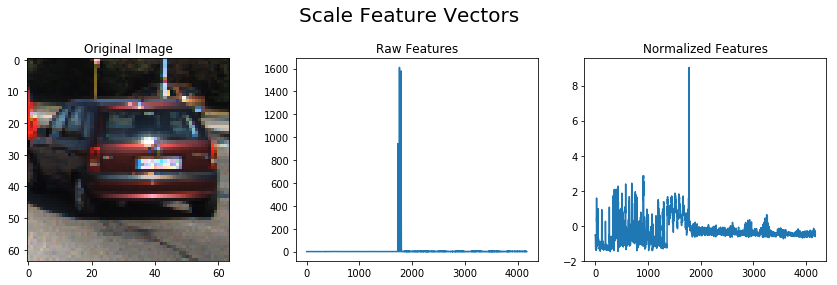

In [21]:
from sklearn.svm import LinearSVC
from sklearn.metrics import accuracy_score


# Choose a group of scaler to display the scaling function 
X_ex = X_syn
X_scaler_ex = StandardScaler().fit(X_ex)
scaled_X_ex = X_scaler_ex.transform(X_ex)
ind = np.random.randint(0, 1000)

# Plot a example of raw and scaled features
fig = plt.figure(figsize=(12,4))
plt.subplot(131)
plt.imshow(mpimg.imread(cars[ind]))
plt.title('Original Image')
plt.subplot(132)
plt.plot(X_ex[ind])
plt.title('Raw Features')
plt.subplot(133)
plt.plot(scaled_X_ex[ind])
plt.title('Normalized Features')
plt.subplots_adjust(hspace=0.2)
plt.suptitle('Scale Feature Vectors', fontsize=20)
fig.tight_layout()
fig.subplots_adjust(top=0.8)
fig.savefig('./output_images/scale_features.png')

## 3.2 Train Classifier Via Scaled Feature Dataset

In [22]:
def train_classifier(car_features, notcar_features):
    """
    The function take both car and notcar features,
    scales them and train a classifier for that features.
    """
    # Create an array stack of feature vectors
    X = np.vstack((car_features, notcar_features)).astype(np.float64)
    # Define the labels vector
    y = np.hstack((np.ones(len(car_features)), 
                   np.zeros(len(notcar_features))))
    # Split up data into randomized training and test sets
    rand_state = np.random.randint(0, 100)
    X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=rand_state)
    
    # Fit a per-column scaler only on the training data
    X_scaler = StandardScaler().fit(X_train)
    # Apply the scaler to X_train and X_test
    X_train = X_scaler.transform(X_train)
    X_test = X_scaler.transform(X_test)
    
    # Use a linear SVC to train the classifier
    svc = LinearSVC()
    svc.fit(X_train, y_train)
    pred = svc.predict(X_test)
    # Calculate the accuracy of the trained classifier
    acc = accuracy_score(pred, y_test)
    
    return X_scaler, svc, acc

In [23]:
# Extract features from dataset
t_start=time.time()
print('From', len(cars), 'CAR images...')
car_features = extract_features(cars, color_space=['RGB', 'LUV', 'HLS'], 
                                spatial_size=(24,24), hist_bins=32, bins_range=(0,256),
                                orient=12, pix_per_cell=8, cell_per_block=2,
                                hog_channel=1, progress_bar=True)
print('From', len(notcars), 'NOTCAR images...')
notcar_features = extract_features(notcars, color_space=['RGB', 'LUV', 'HLS'], 
                                spatial_size=(24,24), hist_bins=32, bins_range=(0,256),
                                orient=12, pix_per_cell=8, cell_per_block=2,
                                hog_channel=1, progress_bar=True)
t_end=time.time()
print(round(t_end-t_start, 2), 'Seconds to extract features.')

# Save the feature vectors
np.save('./output_files/car_features.npy', car_features)
np.save('./output_files/notcar_features.npy', notcar_features)
print('Feature vector are saved successfully')

From 8500 CAR images...
Extract raw features: [####################] 100.0% DONE
Extract color histogram features: [####################] 100.0% DONE
Extract HOG features: [####################] 100.0% DONE
From 8500 NOTCAR images...
Extract raw features: [####################] 100.0% DONE
Extract color histogram features: [####################] 100.0% DONE
Extract HOG features: [####################] 100.0% DONE
166.47 Seconds to extract features.
Feature vector are saved successfully


In [24]:
# Train the classifier
t_start=time.time()
X_scaler, classifier, acc = train_classifier(car_features, notcar_features)
t_end=time.time()
print(round(t_end-t_start, 2), 'Second to train my classifier.')
print('Test Accuracy of the Classifier is {:0.4f}'.format(acc))

# Save the trained SVM model
from sklearn.externals import joblib
joblib.dump(classifier, './output_files/classifier.pkl')
print('Classifier is saved successfully')

40.09 Second to train my classifier.
Test Accuracy of the Classifier is 0.9718
Classifier is saved successfully


# <span style='color:red'>Part 4. Slinding Window</span>

In this part, I implement a sliding window technique to search for vehicles in some test images. 

Tips for this part:
 - try multiscale search or different tiling schemes to see what works best 
 - minimize the number of search windows.
 - cut frame to only keep lane area cause there's no need to search for cars in the sky and the treetops

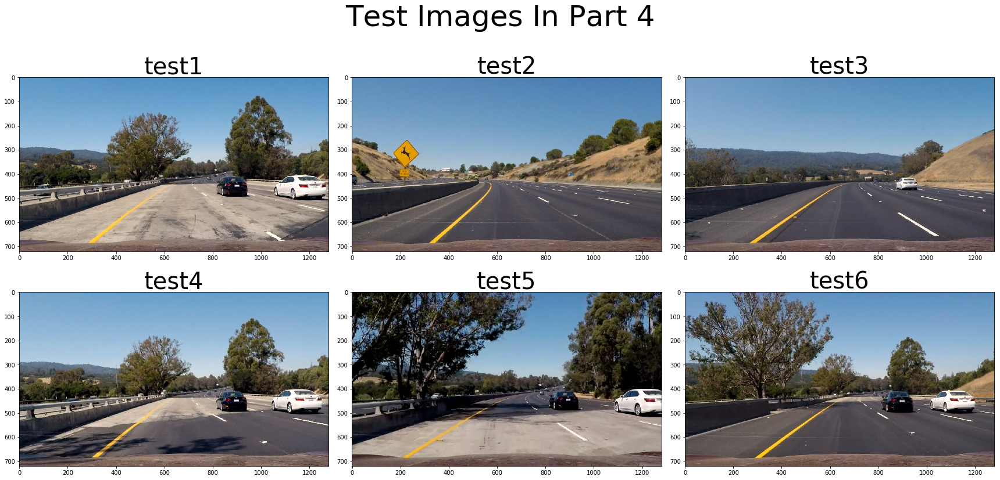

In [25]:
# import test images for sliding window
test_files = glob.glob('./test_images/*.jpg')
test_imgs = []
test_names = []

for file in test_files:
    img = mpimg.imread(file)
    name = file.split('/')[-1].split('.')[0]
    # Append
    test_imgs.append(img)
    test_names.append(name)

# Plot all six test frames
fig, arr = plt.subplots(2, 3, figsize=(24,12))
for i in range(len(test_imgs)):
    r = i//3  # row of image
    c = i - r*3  # clomn of image
    arr[r,c].imshow(test_imgs[i], cmap='gray')
    arr[r,c].set_title(test_names[i], fontsize=40)
plt.subplots_adjust(hspace=0.2)
plt.suptitle('Test Images In Part 4', fontsize=50)
fig.tight_layout()
fig.subplots_adjust(top=0.88)
fig.savefig('./output_images/test_images.png')

## 4.1 Slide window

In [26]:
def slide_window(img, x_start_stop=[None, None], y_start_stop=[None, None],
                    xy_window=(64, 64), xy_overlap=(0.5, 0.5)):
    """
    The function takes an image, start and stop position in both x and y,
    window size (x and y dimensions), and overlap fraction (for both x and y)
    as inputs.
    """
    # If x and/or y start/stop positions not defined, set it/them to images size
    if x_start_stop[0] == None:
        x_start_stop[0] = 0
    if x_start_stop[1] == None:
        x_start_stop[1] = img.shape[1]
    if y_start_stop[0] == None:
        y_start_stop[0] = 0
    if y_start_stop[1] == None:
        y_start_stop[1] = img.shape[0]
    # Compute the span of the region to be searched
    xspan = x_start_stop[1] - x_start_stop[0]
    yspan = y_start_stop[1] - y_start_stop[0]
    # Compute the number of pixels per step in x/y
    nx_pix_per_step = np.int(xy_window[0]*(1 - xy_overlap[0]))
    ny_pix_per_step = np.int(xy_window[1]*(1 - xy_overlap[1]))
    # Compute the number of windows in x/y
    nx_buffer = np.int(xy_window[0]*(xy_overlap[0]))
    ny_buffer = np.int(xy_window[1]*(xy_overlap[1]))
    nx_windows = np.int((xspan-nx_buffer)/nx_pix_per_step)
    ny_windows = np.int((yspan-ny_buffer)/ny_pix_per_step)
    # Initialize a list to append window position to 
    window_list = []
    # Loop through finding x and y window positions
    for y_i in range(ny_windows):
        for x_i in range(nx_windows):
            # Calculate window position
            startx = x_i*nx_pix_per_step + x_start_stop[0]
            endx = startx + xy_window[0]
            starty = y_i*ny_pix_per_step + y_start_stop[0]
            endy = starty + xy_window[1]
            # Append window position to list
            window_list.append(((startx, starty), (endx, endy)))
    # Return the list of windows
    return window_list



def draw_boxes(img, bboxes, color=(0, 0, 255), thick=6):
    """
    The function takes an image, a list of bounding boxes,
    and optional color tuple and line thickness as inputs
    then draw boxes in that color on the output
    """
    # Make a copy of the image
    imgcopy = np.copy(img)
    # Iterate through the bounding boxes
    for bbox in bboxes:
        # Draw a rectangle given bbox coordinates
        cv2.rectangle(imgcopy, bbox[0], bbox[1], color=color, thickness=thick)
    # Return the image copy with boxes drawn
    return imgcopy

__Apply Multi-scale Windows__

In general, I don't know what size my object of interest will be in the image I'm searching. So it makes sense to search in multiple scales. First of all I'll establish a minimum and a maximum scale at which I expect the object to appear, and then reasonabel number of intermediate scales to scan as well.

In this case I choose four scales:(32,32), (64,46), (96,96) and (128,128).

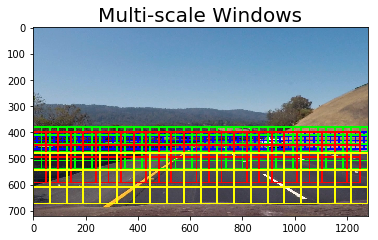

In [27]:
# Set parameters
p_xss = [[None,None], [None,None], [None,None], [None,None]] # x_start_stop
p_yss = [[400,470], [380,550], [400,600],[480,680]] # y_start_stop
p_xyw = [(32,32), (64,64), (96,96), (128,128)] # xy_window
p_xyo = [(0.5,0.5), (0.5,0.5), (0.5,0.5), (0.5,0.5)] # xy_overlap

# Read a test image
image_search = mpimg.imread('./test_images/test3.jpg')
# Converse the image pixel range from (0, 255) to (0, 1)
image_search = image_search.astype(np.float32)/255


# Test my function
windows_list1 = slide_window(image_search, x_start_stop=p_xss[0], y_start_stop=p_yss[0],
                       xy_window=p_xyw[0], xy_overlap=p_xyo[0])
windows_list2 = slide_window(image_search, x_start_stop=p_xss[1], y_start_stop=p_yss[1],
                       xy_window=p_xyw[1], xy_overlap=p_xyo[1])
windows_list3 = slide_window(image_search, x_start_stop=p_xss[2], y_start_stop=p_yss[2],
                       xy_window=p_xyw[2], xy_overlap=p_xyo[2])
windows_list4 = slide_window(image_search, x_start_stop=p_xss[3], y_start_stop=p_yss[3],
                       xy_window=p_xyw[3], xy_overlap=p_xyo[3])

draw_image1 = np.copy(image_search)
window_img = draw_boxes(draw_image1, windows_list1, color=(0,0,1), thick=6) 
window_img = draw_boxes(window_img, windows_list2, color=(0,1,0), thick=6)
window_img = draw_boxes(window_img, windows_list3, color=(1,0,0), thick=6)
window_img = draw_boxes(window_img, windows_list4, color=(1,1,0), thick=6)

plt.imshow(window_img)
plt.title('Multi-scale Windows', fontsize=20)
plt.savefig('./output_images/slide_win.png')

## 4.2 Search and Classify

So far `get_hog_features()`, `bin_spatial()`, `color_hist()`, `extract_features()`, `slide_window()` and `draw_boxes()`.

### 4.2.1 Search in a single image window

In [28]:
def single_img_features(img, color_space=['RGB', 'LUV','HLS'], 
                        spatial_size=(24,24), hist_bins=32, bins_range=(0, 256), 
                        orient=12, pix_per_cell=8, cell_per_block=2, hog_channel=1,
                        spatial_feat=True, hist_feat=True, hog_feat=True):
    """
    Define a function to extract features from a single image window
    This function is very similar to `extract_features()`
    just for a single image rather than list of images
    """
    # Define an empty list to receive features
    img_features = []
    shape = []
    
    # Color space conversion
    raw_feature_img = cspace_convert(img, color_space[0])
    color_feature_img = cspace_convert(img, color_space[1])
    hog_feature_img = cspace_convert(img, color_space[2])
    
    # Compute spatial features if flag is set
    if spatial_feat == True:
        spatial_features = bin_spatial(raw_feature_img, spatial_size)
        # Append features to list
        img_features.append(spatial_features)
        shape.append(spatial_features.shape)
    # Compute histogram features if flag is set
    if hist_feat == True:
        hist_features = color_hist(color_feature_img, hist_bins, bins_range)
        # Append features to list
        img_features.append(hist_features)
        shape.append(hist_features.shape)
    # Compute HOG features if flag is set
    if hog_feat == True:
        if hog_channel=='All':
            hog_features = []
            for channel in range(hog_feature_img.shape[2]):
                channel_hog_feature = get_hog_features(hog_feature_img[:,:,channel],
                                                       orient, pix_per_cell, cell_per_block,
                                                       vis=False, feature_vec=True )
                hog_features.append(channel_hog_feature)
            hog_features = np.ravel(hog_features)
        else:
            hog_features = get_hog_features(hog_feature_img[:,:,hog_channel],
                                            orient, pix_per_cell, cell_per_block, 
                                            vis=False, feature_vec=True)
        # Append features to list
        img_features.append(hog_features)
        shape.append(hog_features.shape)

    # Return concatenated array of features
    return np.concatenate(img_features), shape

In [29]:
# Test the function output size
single_feat, sin_shape = single_img_features(image_search[:64, :64])
assert sin_shape == [car_raw_features[0].shape, car_color_features[0].shape, car_hog_features[0].shape]
print('The feature shape of searching outcome is ', sin_shape, ', the same as the ',
      [car_raw_features[0].shape, car_color_features[0].shape, car_hog_features[0].shape], ' of feature images.')

The feature shape of searching outcome is  [(1728,), (96,), (2352,)] , the same as the  [(1728,), (96,), (2352,)]  of feature images.


### 4.2.2 Search all windows in a image

In [30]:
def search_windows(img, windows, svc, scaler, color_space=['RGB', 'LUV', 'HLS'], 
                   spatial_size=(24,24), hist_bins=32, bins_range=(0, 256), 
                   orient=12, pix_per_cell=8, cell_per_block=2, hog_channel=1,
                   progress_bar=False):
    """
    The function passes an image and 
    the list of windows to be searched (output of `slide_windows()`) 
    """
    # Create an empty list to receive positive detection windows
    on_windows = []
    
    # Iterate over all windows in the list
    for window in windows:
        # Extract the test window from original image
        test_img = cv2.resize(img[window[0][1]:window[1][1], window[0][0]:window[1][0]], (64, 64))      
        # Extract features for that window using single_img_features()
        features, _ = single_img_features(test_img, color_space, 
                                    spatial_size, hist_bins, bins_range, 
                                    orient, pix_per_cell, cell_per_block, hog_channel,
                                    spatial_feat=True, hist_feat=True, hog_feat=True)
        # Scale extracted features to be fed to classifier
        test_features = scaler.transform(np.array(features).reshape(1, -1))
        # Predict using your classifier
        prediction = svc.predict(test_features)
        # If positive (prediction == 1) then save the window
        if prediction == 1:
            on_windows.append(window)
        # Show a progress bar
        if progress_bar == True:
            # Get the index of the current file
            ind = windows.index(window) 
            # Calculate and show the rate of progress 
            update_progress('Search windows...',(ind+1)/len(windows))
             
    # Return windows for positive detections
    return on_windows

Progress Bar: [####################] 100.0% DONE


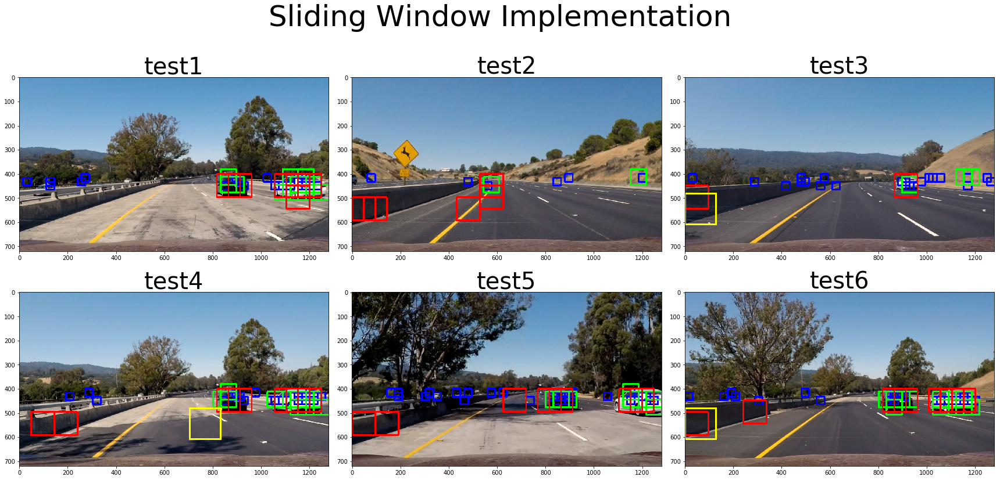

In [31]:
# Test function
fig, arr = plt.subplots(2, 3, figsize=(24, 12))
for i in range(len(test_imgs)):
    # Scale pixel range to (0, 1)
    search_i = test_imgs[i].astype(np.float32)/255
    # Search windows 
    hot_win1_i = search_windows(search_i, windows_list1, classifier, X_scaler) 
    hot_win2_i = search_windows(search_i, windows_list2, classifier, X_scaler)
    hot_win3_i = search_windows(search_i, windows_list3, classifier, X_scaler)
    hot_win4_i = search_windows(search_i, windows_list4, classifier, X_scaler)
    update_progress('Progress Bar', (3*i+1)/18) 
    
    # Draw windows classified as car image
    draw_img_i = np.copy(search_i)
    win_img_i = draw_boxes(draw_img_i, hot_win1_i, color=(0,0,1), thick=6)
    win_img_i = draw_boxes(win_img_i, hot_win2_i, color=(0,1,0), thick=6)
    win_img_i = draw_boxes(win_img_i, hot_win3_i, color=(1,0,0), thick=6)
    win_img_i = draw_boxes(win_img_i, hot_win4_i, color=(1,1,0), thick=6)
    update_progress('Progress Bar', (3*i+2)/18) 
    
    r = i//3 # row of image
    c = i - r*3 # colomn of image
    arr[r,c].imshow(win_img_i, cmap='gray')
    arr[r,c].set_title(test_names[i], fontsize=40)
    update_progress('Progress Bar', (3*i+3)/18) 

fig.subplots_adjust(hspace=0.2)
fig.suptitle('Sliding Window Implementation', fontsize=50)
fig.tight_layout()
fig.subplots_adjust(top=0.88)
fig.savefig('./output_images/draw_windows.png')

## 4.3 Hog Sub-sampling Window Search

__NOTE__

As `mpimg.imread()` import a `*.png` image in pixel range (0,1) while a `*.jpg` image in pixel range (0,255), I'd better converts the pixel range of the image to be searched from (0,255) to (0,1), the as that of the feature images.

In the similar way, the `color` paramter should also be divided by 255 when draw rectangles on the converted image.

Thus I add if condition in line 12~13 to make sure the image to be searched is in pixel range (0,1).

In [32]:
def find_cars(img, xy_start_stop, scale, svc, X_scaler, 
              draw=False, color_space=['RGB', 'LUV', 'HLS'],
              spatial_size=(24,24), hist_bins=32, bins_range=(0, 256),
              orient=12, pix_per_cell=8, cell_per_block=2, hog_channel=1):
    """
    The function extracts features using hog sub-sampling and makes predictions
    And the function can extracts raw, color histogram and HOG features 
    on different color space.
    """
    draw_img = np.copy(img)
    # Scale pixel range to (0,1), the same as feature images to train the classifier
    if img.max() >= 1:
        img = img.astype(np.float32)/255
    
    # Select the area to be searched and resize it with given scale
    (xstart, ystart), (xstop, ystop) = xy_start_stop
    img_tosearch = img[ystart:ystop, xstart:xstop, :]
    if scale != 1:
        imshape = img_tosearch.shape
        img_tosearch = cv2.resize(img_tosearch, (np.int(imshape[1]/scale), np.int(imshape[0]/scale)))

    # Color space conversion on image area to be searched
    raw_feature_img = cspace_convert(img_tosearch, color_space[0])
    color_feature_img = cspace_convert(img_tosearch, color_space[1])
    hog_feature_img = cspace_convert(img_tosearch, color_space[2])

    # Define blocks and steps as above
    nxblocks = (img_tosearch.shape[1] // pix_per_cell) - cell_per_block + 1
    nyblocks = (img_tosearch.shape[0] // pix_per_cell) - cell_per_block + 1
    nfeat_per_block = orient*cell_per_block**2

    # 64 was the original sampling rate, with 8 cells and 8 pix per cell
    window = 64
    nblocks_per_window = (window // pix_per_cell) - cell_per_block + 1
    cells_per_step = 2 # Instead of overlap, define how many cells to step
    nxsteps = (nxblocks - nblocks_per_window) // cells_per_step + 1
    nysteps = (nyblocks - nblocks_per_window) // cells_per_step + 1
    
    # Call get_hog_features() with vis=False, feature_vec=True
    if hog_channel=='All':
        HOG_features = []
        for channel in range(hog_feature_img.shape[2]):
            channel_HOG_feature = get_hog_features(hog_feature_img[:,:,channel],
                                                   orient, pix_per_cell, cell_per_block,
                                                   vis=False, feature_vec=False)
            HOG_features.append(channel_HOG_feature)
    else:
        HOG_features = get_hog_features(hog_feature_img[:,:,hog_channel],
                                        orient, pix_per_cell, cell_per_block, 
                                        vis=False, feature_vec=False)
    
    # Collect features and predict corresponding label of each window
    hot_windows = []
    for x_i in range(nxsteps):
        for y_i in range(nysteps):
            ypos = y_i*cells_per_step
            xpos = x_i*cells_per_step

            # Extract HOG for this patch
            if hog_channel=='All':
                hog_features = []
                for channel_HOG_feature in HOG_features:
                    channel_hog_feature = channel_HOG_feature[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
                    hog_features.append(channel_hog_feature)
                hog_features = np.ravel(hog_features)
            else:
                hog_features = HOG_features[ypos:ypos+nblocks_per_window, xpos:xpos+nblocks_per_window].ravel() 
            
            xleft = xpos*pix_per_cell
            ytop = ypos*pix_per_cell
            # Extract the image patch
            raw_subimg = cv2.resize(raw_feature_img[ytop:(ytop+window), xleft:(xleft+window)], (64,64))
            color_subimg = cv2.resize(color_feature_img[ytop:(ytop+window), xleft:(xleft+window)], (64,64))
            
            # Get raw features 
            raw_features = bin_spatial(raw_subimg, spatial_size=spatial_size)
            # Get color histogram features
            color_features = color_hist(color_subimg, hist_bins=hist_bins, bins_range=bins_range)
            
            # Scale features and make a prediction
            test_features = X_scaler.transform(np.hstack((raw_features, color_features, hog_features)).reshape(1,-1))
            test_prediction = svc.predict(test_features)

            # Draw rectangle on car image
            if test_prediction == 1:
                xbox_left = np.int(xleft*scale)
                ytop_draw = np.int(ytop*scale)
                win_draw = np.int(window*scale)
                hot_win = [(xbox_left+xstart, ytop_draw+ystart), (xbox_left+xstart+win_draw,ytop_draw+ystart+win_draw)]
                hot_windows.append(hot_win)
                if draw==True:
                    cv2.rectangle(draw_img, hot_win[0],hot_win[1], (0,0,255),6)               
    if draw==True:
        return draw_img, hot_windows
    else:
        return hot_windows

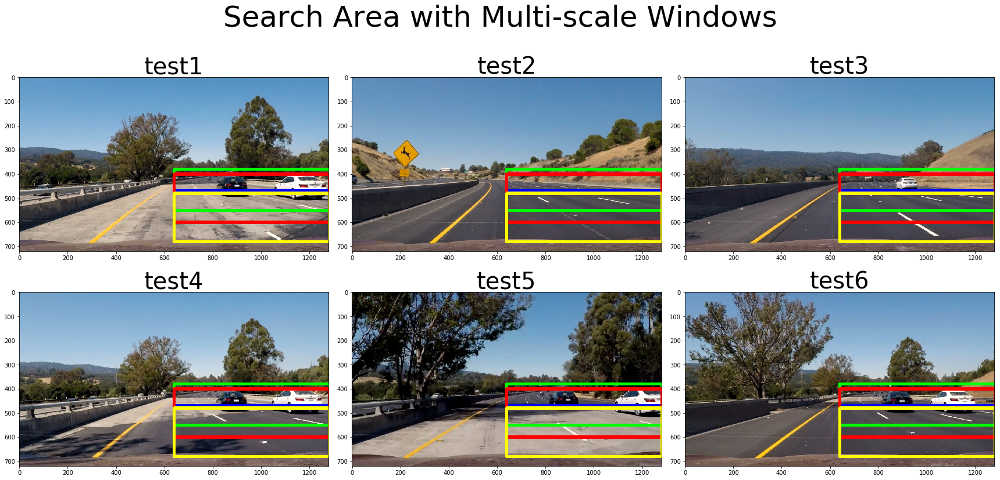

In [33]:
# Test function
fig, arr = plt.subplots(2, 3, figsize=(24,12))
for i in range(len(test_imgs)):
    draw_img_i = np.copy(test_imgs[i])
    cv2.rectangle(draw_img_i, (640,400), (1280,470), (0,0,255),12)
    cv2.rectangle(draw_img_i, (640,380), (1280,550), (0,255,0),12)
    cv2.rectangle(draw_img_i, (640,400), (1280,600), (255,0,0),12)
    cv2.rectangle(draw_img_i, (640,480), (1280,680), (255,255,0),12)
    
    r = i//3  # row of image
    c = i - r*3  # clomn of image
    arr[r,c].imshow(draw_img_i, cmap='gray')
    arr[r,c].set_title(test_names[i], fontsize=40)

plt.subplots_adjust(hspace=0.2)
plt.suptitle('Search Area with Multi-scale Windows', fontsize=50)
fig.tight_layout()
fig.subplots_adjust(top=0.88)
fig.savefig('./output_images/search_area.png')

Progress Bar: [####################] 100.0% DONE


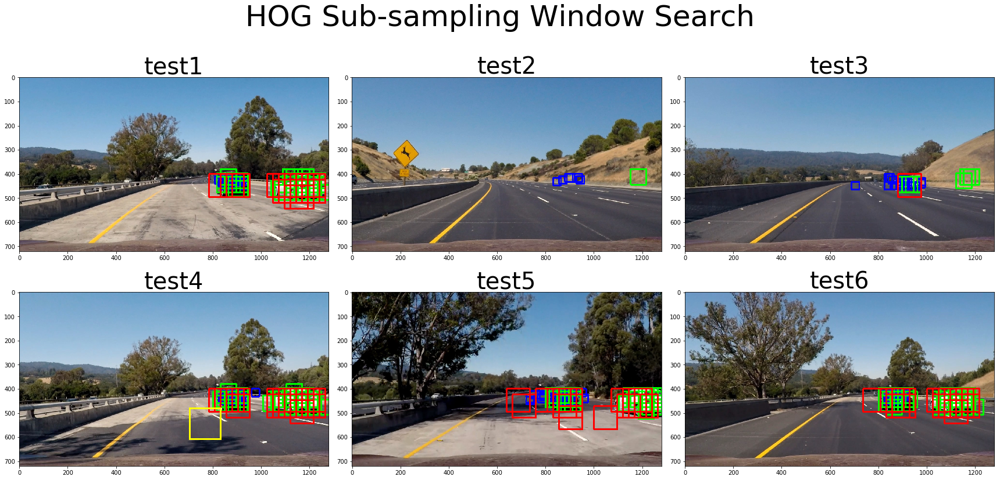

In [34]:
# Draw detected windows 
fig, arr = plt.subplots(2, 3, figsize=(24, 12))

hot_win_list = []
for i in range(len(test_imgs)):
    hot_win1 = find_cars(test_imgs[i],xy_start_stop=[(640,400),(1000,470)], scale=32/64,
                         svc=classifier, X_scaler=X_scaler, draw=False,
                         color_space=['RGB', 'LUV', 'HLS'],
                         spatial_size=(24,24), hist_bins=32, bins_range=(0,256),
                         orient=12, pix_per_cell=8, cell_per_block=2, hog_channel=1)
    hot_win2 = find_cars(test_imgs[i],xy_start_stop=[(640,380),(1280,550)], scale=64/64,
                         svc=classifier, X_scaler=X_scaler, draw=False,
                         color_space=['RGB', 'LUV', 'HLS'],
                         spatial_size=(24,24), hist_bins=32, bins_range=(0,256),
                         orient=12, pix_per_cell=8, cell_per_block=2, hog_channel=1)
    hot_win3 = find_cars(test_imgs[i],xy_start_stop=[(640,400),(1280,600)], scale=96/64,
                         svc=classifier, X_scaler=X_scaler, draw=False,
                         color_space=['RGB', 'LUV', 'HLS'],
                         spatial_size=(24,24), hist_bins=32, bins_range=(0,256),
                         orient=12, pix_per_cell=8, cell_per_block=2, hog_channel=1)
    hot_win4 = find_cars(test_imgs[i],xy_start_stop=[(640,480),(1280,680)], scale=128/64,
                         svc=classifier, X_scaler=X_scaler, draw=False,
                         color_space=['RGB', 'LUV', 'HLS'],
                         spatial_size=(24,24), hist_bins=32, bins_range=(0,256),
                         orient=12, pix_per_cell=8, cell_per_block=2, hog_channel=1)
    hot_win_list.append(hot_win1 + hot_win2 + hot_win3 + hot_win4)
    
    draw_img_i = np.copy(test_imgs[i])
    for win in hot_win1:
        cv2.rectangle(draw_img_i, win[0],win[1], (0,0,255),6)
    for win in hot_win2:
        cv2.rectangle(draw_img_i, win[0],win[1], (0,255,0),6) 
    for win in hot_win3:
        cv2.rectangle(draw_img_i, win[0],win[1], (255,0,0),6) 
    for win in hot_win4:
        cv2.rectangle(draw_img_i, win[0],win[1], (255,255,0),6) 
    
    r = i//3 # row of image
    c = i - r*3 # colomn of image
    arr[r,c].imshow(draw_img_i, cmap='gray')
    arr[r,c].set_title(test_names[i], fontsize=40)
    update_progress('Progress Bar',(i+1)/6) 

fig.subplots_adjust(hspace=0.2)
fig.suptitle('HOG Sub-sampling Window Search', fontsize=50)
fig.tight_layout()
fig.subplots_adjust(top=0.88)
fig.savefig('./output_images/sub_sampling.png')

## 4.3  Multiple Detections & False Positives

### 4.3.1 Take heat map

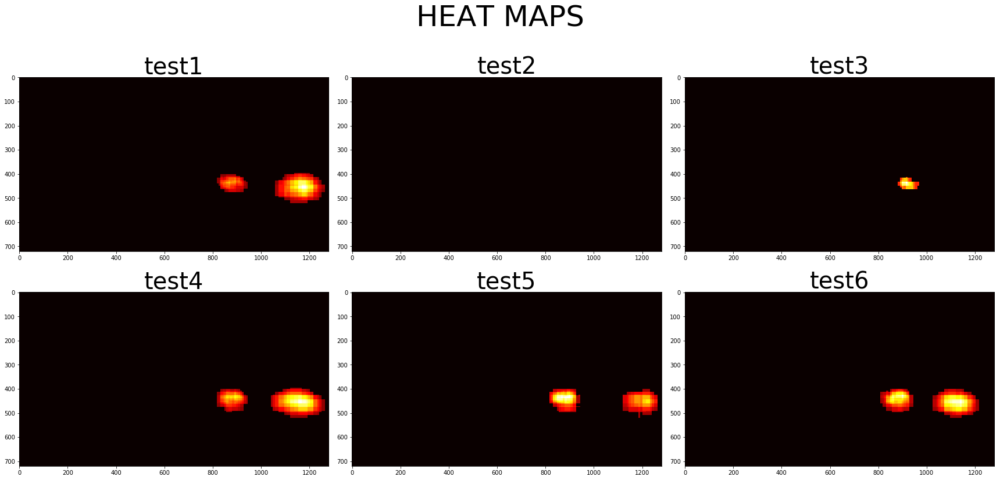

In [35]:
def add_heat(heatmap, bbox_list):
    """
    The function adds 'heat' to a map for a list of bounding boxes.
    """
    # Iterate through list of bboxes
    for box in bbox_list:
        # Add += 1 for all pixels inside eacch bbox
        # Assuming each 'box' takes the form ((x1, y1), (x2, y2))
        heatmap[box[0][1]:box[1][1], box[0][0]:box[1][0]] += 1
        
    # Return updated heatmap
    return heatmap

def apply_threshold(heatmap, threshold):
    """
    The function zeros out pixels below the threshold from the heatmap
    """
    heatmap[heatmap <= threshold] = 0
    
    return heatmap



# Test functions
p_th = 3 # threshold for `apply_threshold()`
heat_maps = []

fig, arr = plt.subplots(2, 3, figsize=(24, 12))
for i in range(len(test_imgs)):
    # Scale pixel range to (0, 1)
    search_i = test_imgs[i].astype(np.float32)/255
    # Get hot windows
    hot_win_i = hot_win_list[i]
    
    # Create a heatmap 
    heat_i = np.zeros_like(search_i[:,:,0].astype(np.float))
    # Add heat to each box in hot windows
    heat_i = add_heat(heat_i, hot_win_i)
    # Apply threshold to help remove false positives
    heat_i = apply_threshold(heat_i, 4)
    # Visualize the heatmap when displaying
    heatmap_i = np.clip(heat_i, 0, 255)
    heat_maps.append(heatmap_i)
    
    r = i//3 # row of image
    c = i - r*3 # colomn of image
    arr[r,c].imshow(heatmap_i, cmap='hot')
    arr[r,c].set_title(test_names[i], fontsize=40)
    
plt.subplots_adjust(hspace=0.2)
plt.suptitle('HEAT MAPS', fontsize=50)
fig.tight_layout()
fig.subplots_adjust(top=0.88)
fig.savefig('./output_images/heat_map.png')

### 4.3.2 Draw bounding boxes

In [36]:
from scipy.ndimage.measurements import label

def draw_labeled_bboxes(img, labels):
    """
    The function takes the `labels` image 
    and put bounding boxes around the labeled regions.
    """
    # Iterate through all detected cars
    bboxes = []
    for car_number in range(1, labels[1]+1):
        nonzero = (labels[0] == car_number).nonzero()
        # Identify x and y values of those pixels
        nonzeroy = np.array(nonzero[0])
        nonzerox = np.array(nonzero[1])
        # Define a bounding box based on min/max x and y
        bbox = [(np.min(nonzerox), np.min(nonzeroy)), (np.max(nonzerox), np.max(nonzeroy))]
        bboxes.append(bbox)
        # Draw the box on the image
        cv2.rectangle(img, bbox[0], bbox[1], (0,0,255), 6)
    # Return the image
    return img, bboxes

Progress Bar: [####################] 100.0% DONE


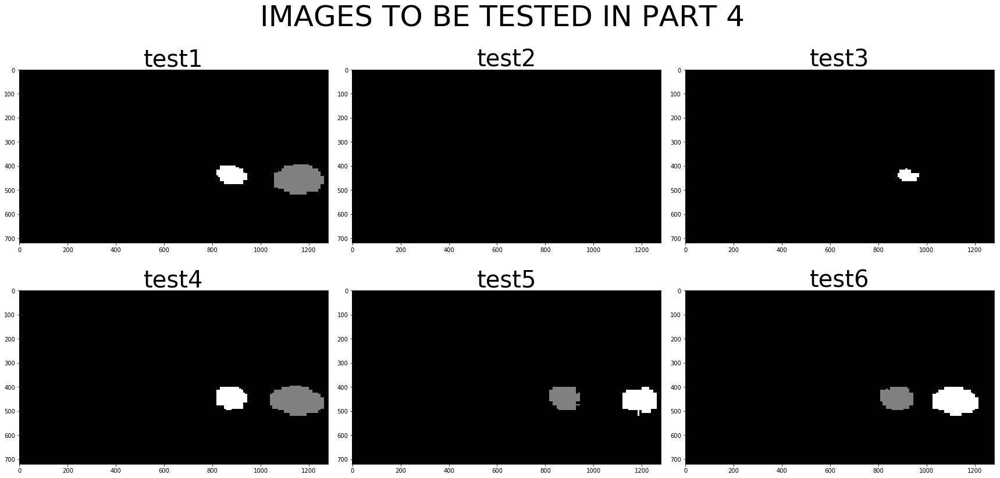

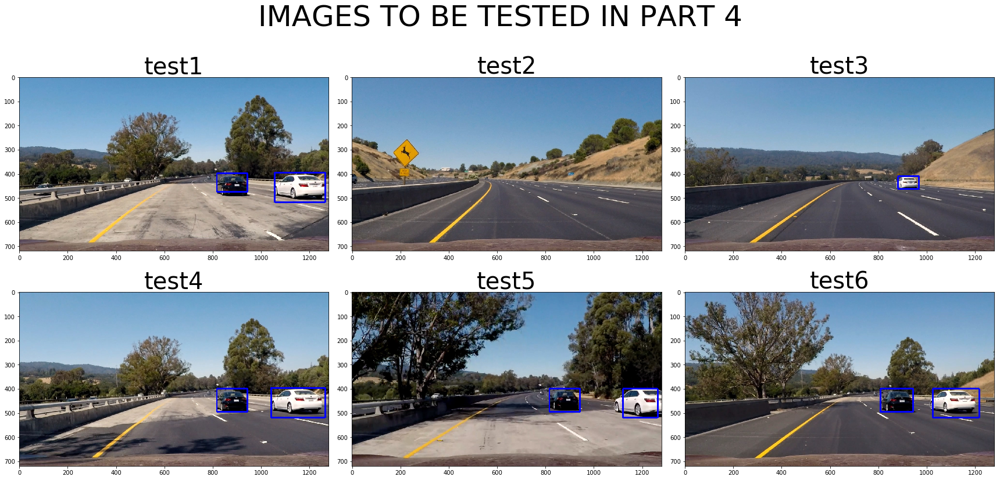

In [37]:
# Find final boxes from heatmap using label function
fig1, arr1 = plt.subplots(2, 3, figsize=(24, 12))
fig2, arr2 = plt.subplots(2, 3, figsize=(24, 12))
fig1.tight_layout()
fig2.tight_layout()

for i in range(len(test_imgs)):
    # Scale pixel range to (0, 1)
    labels_i = label(heat_maps[i])
    draw_img_i, _ = draw_labeled_bboxes(np.copy(test_imgs[i]), labels_i)
    update_progress('Progress Bar', (2*i+1)/12)
    
    r = i//3 # row of image
    c = i - r*3 # colomn of image
    arr1[r,c].imshow(labels_i[0], cmap='gray')
    arr1[r,c].set_title(test_names[i], fontsize=40)
    arr2[r,c].imshow(draw_img_i, cmap='gray')
    arr2[r,c].set_title(test_names[i], fontsize=40)
    update_progress('Progress Bar', (2*i+2)/12)
    
plt.subplots_adjust(hspace=0.2)
plt.tight_layout()

fig1.suptitle('IMAGES TO BE TESTED IN PART 4', fontsize=50)
fig1.subplots_adjust(top=0.88)
fig1.savefig('./output_images/labels.png')

fig2.suptitle('IMAGES TO BE TESTED IN PART 4', fontsize=50)
fig2.subplots_adjust(top=0.88)
fig2.savefig('./output_images/bboxes.png')

# <span style='color:red'>Part 5. Detection Pipeline</span>

After getting a working detection pipeline, I'll try it on a video stream.
And implement tracking to follow, detect vehicles. And reject spurious detections

## 5.1 Define Function to Process Video Frame

In [38]:
def pipeline(frame):
    """
    The function steps:
    1. Image Preprocessing
        1.1 pick out the image to be searched in a video frame
        1.2 resize to be the same size as that of train dataset
        1.3 convert to appropriate color space
    2. Extract the HOG Features of the Entire Image
    3. Search and Classify Features Window by Window
        3.1 extract sub-array of HOG features 
        3.2 extract other features of the sub-image
        3.3 features prediction
        3.4 draw rectangle if window prediction is positive
    4. Return the drawn image and the list of positive windows
    """
    # Multi-scale window search
    hot_win1 = find_cars(frame,[(640,400),(1000,470)], scale=32/64,
                         svc=classifier, X_scaler=X_scaler,
                         color_space=['RGB', 'LUV', 'HLS'],
                         spatial_size=(24,24), hist_bins=32, bins_range=(0,256),
                         orient=12, pix_per_cell=8, cell_per_block=2, hog_channel=1)
    hot_win2 = find_cars(frame,[(640,380),(1280,550)], scale=64/64,
                         svc=classifier, X_scaler=X_scaler, draw=False,
                         color_space=['RGB', 'LUV', 'HLS'],
                         spatial_size=(24,24), hist_bins=32, bins_range=(0,256),
                         orient=12, pix_per_cell=8, cell_per_block=2, hog_channel=1)
    hot_win3 = find_cars(frame,[(640,400),(1280,600)], scale=96/64,
                         svc=classifier, X_scaler=X_scaler, draw=False,
                         color_space=['RGB', 'LUV', 'HLS'],
                         spatial_size=(24,24), hist_bins=32, bins_range=(0,256),
                         orient=12, pix_per_cell=8, cell_per_block=2, hog_channel=1)
    hot_win4 = find_cars(frame,[(640,480),(1280,680)], scale=128/64,
                         svc=classifier, X_scaler=X_scaler, draw=False,
                         color_space=['RGB', 'LUV', 'HLS'],
                         spatial_size=(24,24), hist_bins=32, bins_range=(0,256),
                         orient=12, pix_per_cell=8, cell_per_block=2, hog_channel=1)
    #hot_windows = np.array((hot_windows1 + hot_windows2))
    hot_windows = hot_win1 + hot_win2 + hot_win3 + hot_win4
    
    # Scale frame pixel range
    if frame.max() > 1:
        search = frame.astype(np.float32)/255
    else:
        search = np.copy(frame)
    
    # Apply threshold and get heatmap
    heat = np.zeros_like(search[:,:,0].astype(np.float))
    heat = add_heat(heat, hot_windows)
    heat = apply_threshold(heat, 7)
    heat_map = np.clip(heat, 0, 255)
    
    # Get labels
    labels = label(heat_map)
    # Draw bounding boxes
    draw_bboxes, _ = draw_labeled_bboxes(np.copy(frame), labels)
    
    return draw_bboxes

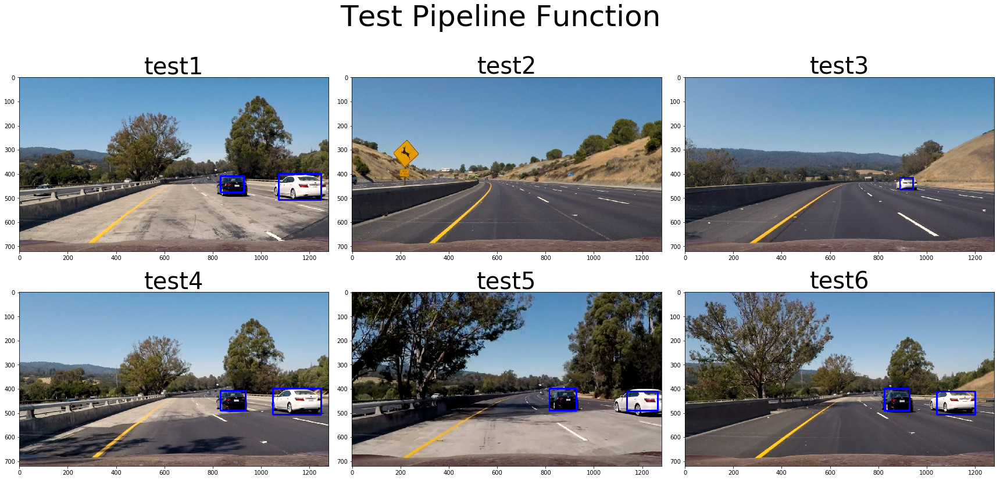

In [39]:
# Test function
fig, arr = plt.subplots(2, 3, figsize=(24,12))
for i in range(len(test_imgs)):
    output_i = pipeline(test_imgs[i])
    
    r = i//3  # row of image
    c = i - r*3  # clomn of image
    arr[r,c].imshow(output_i, cmap='gray')
    arr[r,c].set_title(test_names[i], fontsize=40)

plt.subplots_adjust(hspace=0.2)
plt.suptitle('Test Pipeline Function', fontsize=50)
fig.tight_layout()
fig.subplots_adjust(top=0.88)
fig.savefig('./output_images/pipeline.png')

## 5.2 Video Detection Output

In [40]:
# Import everything needed to edit/save/watch video clips
from moviepy.editor import VideoFileClip
from IPython.display import HTML


white_output1 = './output_videos/test_video.mp4'

clip1 = VideoFileClip("./test_video.mp4")
#bboxes=[]
white_clip1 = clip1.fl_image(pipeline)
%time white_clip1.write_videofile(white_output1, audio=False)

[MoviePy] >>>> Building video ./output_videos/test_video.mp4
[MoviePy] Writing video ./output_videos/test_video.mp4


 97%|█████████▋| 38/39 [00:34<00:00,  1.10it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_videos/test_video.mp4 

CPU times: user 33 s, sys: 1.95 s, total: 34.9 s
Wall time: 36.4 s


In [41]:
HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(white_output1))

In [42]:
white_output2 = './output_videos/project_video.mp4'

clip2 = VideoFileClip("./project_video.mp4")
white_clip2 = clip2.fl_image(pipeline)
%time white_clip2.write_videofile(white_output2, audio=False)

[MoviePy] >>>> Building video ./output_videos/project_video.mp4
[MoviePy] Writing video ./output_videos/project_video.mp4


100%|█████████▉| 1260/1261 [19:38<00:00,  1.08it/s]


[MoviePy] Done.
[MoviePy] >>>> Video ready: ./output_videos/project_video.mp4 

CPU times: user 18min 37s, sys: 1min 3s, total: 19min 40s
Wall time: 19min 40s


In [43]:
HTML("""
<video width="1280" height="720" controls>
  <source src="{0}">
</video>
""".format(white_output2))